<a href="https://colab.research.google.com/github/WNderitu/data_science_capstone_project/blob/main/malaria_parasite_object_detection_count.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


# **Plasmodium Vivax (malaria) parasite detector and counter**

## **1.0 Introduction**

## **1.1 Problem Statement**

## **1.2 Objectives**

1. To detect Plasmodium Vivax (malaria parasite) in human cells
2. To count the number of detected plasmodium vivax parasites per image

## **1.3 Image dataset**

Dataset courced from: https://bbbc.broadinstitute.org/BBBC041/

The dataset consists of:
- image folder
- training json file
- test json file

The dataset consists of 1,328 microscopic images of blood smears

## **1.4 Installing & Importing Required Libraries**

In [4]:
!pip install Pillow #installing PILLOW LIBRARY

In [5]:
!pip install matplotlib

In [6]:
!pip install imagehash

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.7/296.7 kB 6.7 MB/s eta 0:00:00


In [7]:
!pip install pyyaml

In [51]:
import os
import json
import random
from pprint import pprint #
import PIL
from PIL import Image, ImageDraw, ImageFont
import matplotlib.pyplot as plt
from collections import Counter
import hashlib # find identical images
from collections import defaultdict
import imagehash # find visually identical images
import numpy as np
import yaml

In [2]:
    !pip install ultralytics

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 32.5 MB/s eta 0:00:00


## **1.5 Loading & Understanding Malaria Dataset structure**

In [13]:
# load malaria folder
%cd /content/drive/MyDrive/malaria

/content/drive/MyDrive/malaria


In [14]:
# Look inside the malaria folder
print("Contents of malaria/:", os.listdir("/content/drive/MyDrive/malaria"))

Contents of malaria/: ['training.json', 'test.json', '.DS_Store', 'images']


In [15]:
# List all files ending in common image extensions
# Path to your images
image_folder = "/content/drive/MyDrive/malaria/images"

image_files = [f for f in os.listdir(image_folder) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# print the results
print(f"Number of images in '{image_folder}': {len(image_files)}")
print("Example files:", image_files[:5])

Number of images in '/content/drive/MyDrive/malaria/images': 1328
Example files: ['3d302619-473d-4c5b-af43-8833ff94233f.png', 'ac4d6507-d710-497b-ad7c-e0dd75c1d06d.png', 'c8fd1336-dd0a-4f97-abbf-be2c18b91e02.png', '7d65d296-0f7b-41cc-9073-a547e24326c8.png', 'd67fb447-4dd7-4a82-a305-2b70927b69bb.png']


In [16]:
# Load training JSON file from google drive
train_data = json.load(open("training.json"))

In [17]:
# Load test JSON file from google drive
test_data = json.load(open("test.json"))

In [18]:
# check format of training JSON files
print(f"Type of JSON root: {type(train_data)}")
print(f"Number of items: {len(train_data)}")

# show first example
print("\nFirst entry:")
pprint(train_data[0])

Type of JSON root: <class 'list'>
Number of items: 1208

First entry:
{'image': {'checksum': '676bb8e86fc2dbf05dd97d51a64ac0af',
           'pathname': '/images/8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png',
           'shape': {'c': 1600, 'channels': 3, 'r': 1200}},
 'objects': [{'bounding_box': {'maximum': {'c': 1540, 'r': 1158},
                               'minimum': {'c': 1440, 'r': 1057}},
              'category': 'red blood cell'},
             {'bounding_box': {'maximum': {'c': 1403, 'r': 971},
                               'minimum': {'c': 1303, 'r': 868}},
              'category': 'red blood cell'},
             {'bounding_box': {'maximum': {'c': 1008, 'r': 689},
                               'minimum': {'c': 900, 'r': 578}},
              'category': 'red blood cell'},
             {'bounding_box': {'maximum': {'c': 713, 'r': 408},
                               'minimum': {'c': 611, 'r': 304}},
              'category': 'red blood cell'},
             {'bounding_box': {'m

In [19]:
# check format of test JSON files
print(f"Type of JSON root: {type(test_data)}")
print(f"Number of items: {len(test_data)}")

# show first example
print("\nFirst entry:")
pprint(test_data[0])

Type of JSON root: <class 'list'>
Number of items: 120

First entry:
{'image': {'checksum': 'eea3bfd6a929bcb06f9786667cd3fbb2',
           'pathname': '/images/41be1bd3-0d31-4881-bf1f-3ccdfa21ff12.jpg',
           'shape': {'c': 1944, 'channels': 3, 'r': 1383}},
 'objects': [{'bounding_box': {'maximum': {'c': 1883, 'r': 708},
                               'minimum': {'c': 1744, 'r': 576}},
              'category': 'red blood cell'},
             {'bounding_box': {'maximum': {'c': 1373, 'r': 977},
                               'minimum': {'c': 1249, 'r': 863}},
              'category': 'red blood cell'},
             {'bounding_box': {'maximum': {'c': 1711, 'r': 335},
                               'minimum': {'c': 1573, 'r': 210}},
              'category': 'red blood cell'},
             {'bounding_box': {'maximum': {'c': 1253, 'r': 1142},
                               'minimum': {'c': 1124, 'r': 1017}},
              'category': 'red blood cell'},
             {'bounding_box': {

In [20]:
# Check the type
print(f"Type of JSON root: {type(train_data)}")
print(f"Number of items: {len(train_data)}")

# Show first example
print("\nFirst entry:")
pprint(train_data[0])

Type of JSON root: <class 'list'>
Number of items: 1208

First entry:
{'image': {'checksum': '676bb8e86fc2dbf05dd97d51a64ac0af',
           'pathname': '/images/8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.png',
           'shape': {'c': 1600, 'channels': 3, 'r': 1200}},
 'objects': [{'bounding_box': {'maximum': {'c': 1540, 'r': 1158},
                               'minimum': {'c': 1440, 'r': 1057}},
              'category': 'red blood cell'},
             {'bounding_box': {'maximum': {'c': 1403, 'r': 971},
                               'minimum': {'c': 1303, 'r': 868}},
              'category': 'red blood cell'},
             {'bounding_box': {'maximum': {'c': 1008, 'r': 689},
                               'minimum': {'c': 900, 'r': 578}},
              'category': 'red blood cell'},
             {'bounding_box': {'maximum': {'c': 713, 'r': 408},
                               'minimum': {'c': 611, 'r': 304}},
              'category': 'red blood cell'},
             {'bounding_box': {'m

In [21]:
# check every image listed in training.json actually exists in images folder
train_json_images = [os.path.basename(item["image"]["pathname"]) for item in train_data]
missing = [img for img in train_json_images if img not in image_files]

print(f"train JSON images: {len(train_json_images)}")
print(f"Found in image folder: {len(image_files)}")
print(f"Missing images: {len(missing)}")

if missing:
    print("Missing examples:", missing[:5])


train JSON images: 1208
Found in image folder: 1328
Missing images: 0


In [22]:
# check every image listed in test.json actually exists in images folder
test_json_images = [os.path.basename(item["image"]["pathname"]) for item in test_data]
missing = [img for img in test_json_images if img not in image_files]

print(f"test JSON images: {len(test_json_images)}")
print(f"Found in image folder: {len(image_files)}")
print(f"Missing images: {len(missing)}")

if missing:
    print("Missing examples:", missing[:5])

test JSON images: 120
Found in image folder: 1328
Missing images: 0


In [24]:
# Collect all category names from all images
all_categories = []

for item in train_data:
    for obj in item["objects"]:
        cat = obj["category"].lower().strip()
        all_categories.append(cat)

# Count occurrences
category_counts = Counter(all_categories)

# Display summary
print(" Category Summary (All objects):\n")
for cat, count in category_counts.items():
    print(f"{cat.title():<25}: {count}")

# Optionally, show total objects
total = sum(category_counts.values())
print(f"\nTotal objects (all categories): {total}")

 Category Summary (All objects):

Red Blood Cell           : 77420
Trophozoite              : 1473
Schizont                 : 179
Difficult                : 441
Ring                     : 353
Leukocyte                : 103
Gametocyte               : 144

Total objects (all categories): 80113


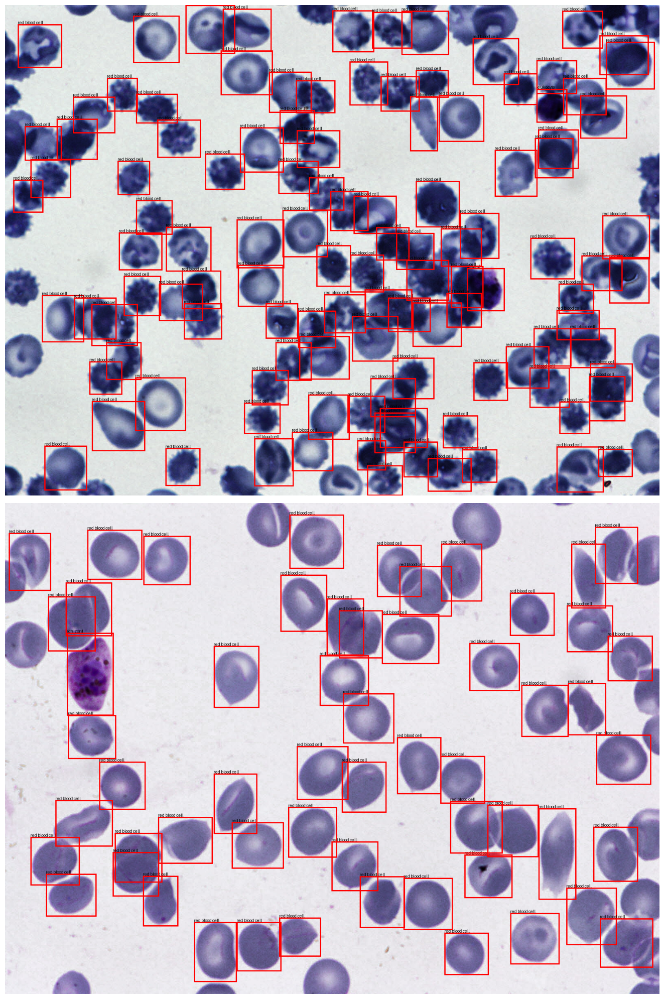

In [25]:
# view 2 train images with the annotations and categories
# Randomly sample 2 images
train_samples = random.sample(train_data,2)

# Try loading a font (fallback to default)
try:
    font = ImageFont.truetype("arial.ttf",34)
except:
    font = ImageFont.load_default()

plt.figure(figsize=(20,20))

for idx, sample in enumerate(train_samples):
    img_path = os.path.join("images", os.path.basename(sample["image"]["pathname"]))
    img = Image.open(img_path).convert("RGB")

    draw = ImageDraw.Draw(img)
    for obj in sample["objects"]:
        box = obj["bounding_box"]
        xmin, ymin = box["minimum"]["c"], box["minimum"]["r"]
        xmax, ymax = box["maximum"]["c"], box["maximum"]["r"]
        category = obj["category"]
        draw.rectangle([xmin, ymin, xmax, ymax], outline="red", width=3)
        draw.text((xmin, ymin - 10), category, fill="black", font=font)

    plt.subplot(2, 1, idx + 1)
    plt.imshow(img)
    plt.axis("off")

plt.tight_layout()
plt.show()

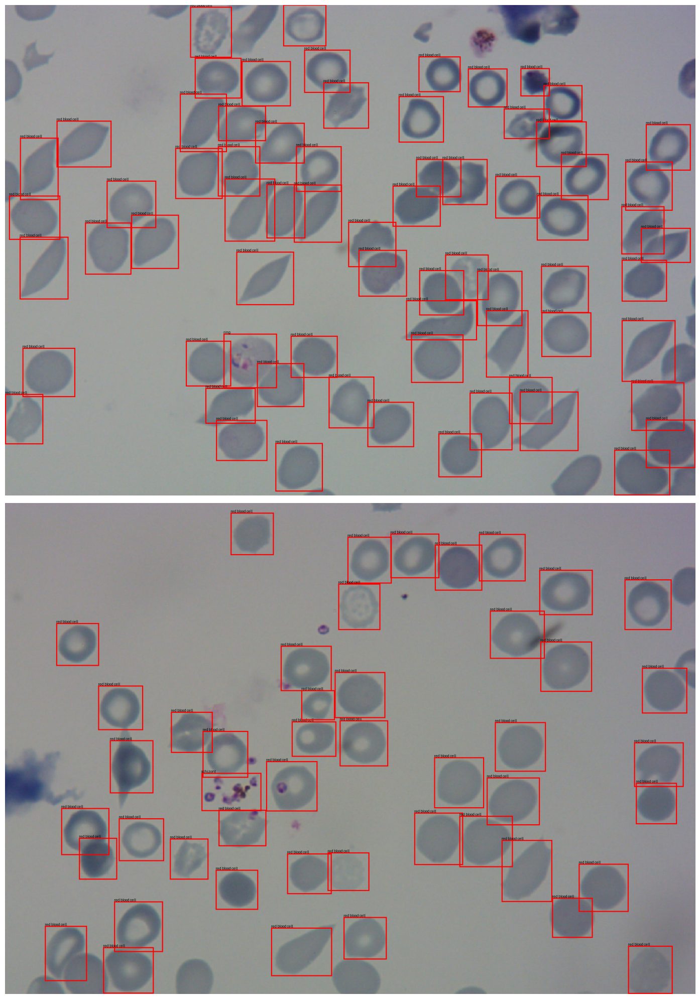

In [26]:
# view 2 test images with the annotations and categories
# Randomly sample 2 images
test_samples = random.sample(test_data,2)

# Try loading a font (fallback to default)
try:
    font = ImageFont.truetype("arial.ttf",34)
except:
    font = ImageFont.load_default()

plt.figure(figsize=(20,20))

for idx, sample in enumerate(test_samples):
    img_path = os.path.join("images", os.path.basename(sample["image"]["pathname"]))
    img = Image.open(img_path).convert("RGB")

    draw = ImageDraw.Draw(img)
    for obj in sample["objects"]:
        box = obj["bounding_box"]
        xmin, ymin = box["minimum"]["c"], box["minimum"]["r"]
        xmax, ymax = box["maximum"]["c"], box["maximum"]["r"]
        category = obj["category"]
        draw.rectangle([xmin, ymin, xmax, ymax], outline="red", width=3)
        draw.text((xmin, ymin - 10), category, fill="black", font=font)

    plt.subplot(2, 1, idx + 1)
    plt.imshow(img)
    plt.axis("off")

plt.tight_layout()
plt.show()

## **1.6 Data Cleaning**

**Check for corrupted images & remove**

In [27]:
# Open each image and skip unreadable files
image_folder = "/content/drive/MyDrive/malaria/images"

for fname in os.listdir(image_folder):
    if fname.lower().endswith((".jpg", ".jpeg", ".png")):
        try:
            img = Image.open(os.path.join(image_folder, fname))
            img.verify()  # checks for corruption
        except Exception as e:
            print("Corrupt image removed:", fname)
            os.remove(os.path.join(image_folder, fname))

**Check duplicate images**

In [ ]:
# Function to compute hash
def file_hash(filepath):
    with open(filepath, "rb") as f:
        return hashlib.md5(f.read()).hexdigest()

# Compute hashes for all images
hash_dict = defaultdict(list)
for filename in os.listdir(image_folder):
    if filename.lower().endswith((".jpg", ".png", ".jpeg")):
        path = os.path.join(image_folder, filename)
        h = file_hash(path)
        hash_dict[h].append(filename)

# Report duplicates
duplicates = {h: files for h, files in hash_dict.items() if len(files) > 1}

print(f"Found {len(duplicates)} groups of duplicate images.")
for h, files in list(duplicates.items())[:5]:  # show first 5 examples
    print("→", files)

Found 0 groups of duplicate images.


**Check visually similar images**

In [ ]:

hash_dict = defaultdict(list)

for filename in os.listdir(image_folder):
    if filename.lower().endswith((".jpg", ".png", ".jpeg")):
        path = os.path.join(image_folder, filename)
        img = Image.open(path)
        h = str(imagehash.phash(img))  # perceptual hash
        hash_dict[h].append(filename)

duplicates = {h: files for h, files in hash_dict.items() if len(files) > 1}

print(f"Found {len(duplicates)} visually duplicate groups.")
for h, files in list(duplicates.items())[:5]:
    print("→", files)

Found 1 visually duplicate groups.
→ ['3061aac0-cda3-47d1-8c48-6293e9ffdf36.png', 'f329e01b-fbd3-4fb5-9738-a7ff4c8622b8.png']


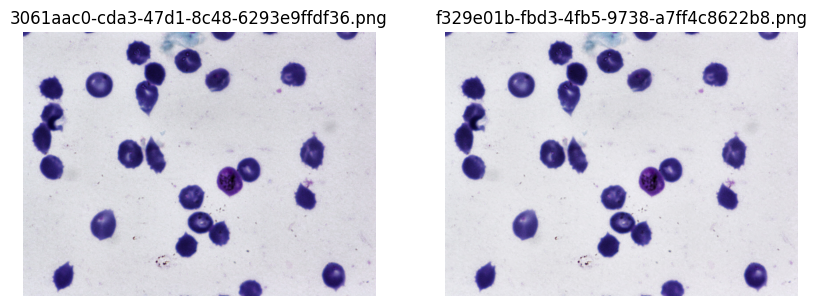

In [ ]:
# Show the first two duplicates side by side
imgs = [Image.open(os.path.join(image_folder, f)) for f in files[:2]]
plt.figure(figsize=(10,4))
for i, img in enumerate(imgs):
    plt.subplot(1,2,i+1)
    plt.imshow(img)
    plt.title(files[i])
    plt.axis("off")
plt.show()

**Check class imbalance**

TRAIN set:
difficult: 441 (0.55%)
gametocyte: 144 (0.18%)
leukocyte: 103 (0.13%)
red blood cell: 77420 (96.64%)
ring: 353 (0.44%)
schizont: 179 (0.22%)
trophozoite: 1473 (1.84%)

 TEST set:
difficult: 5 (0.08%)
gametocyte: 12 (0.20%)
leukocyte: 0 (0.00%)
red blood cell: 5614 (94.80%)
ring: 169 (2.85%)
schizont: 11 (0.19%)
trophozoite: 111 (1.87%)


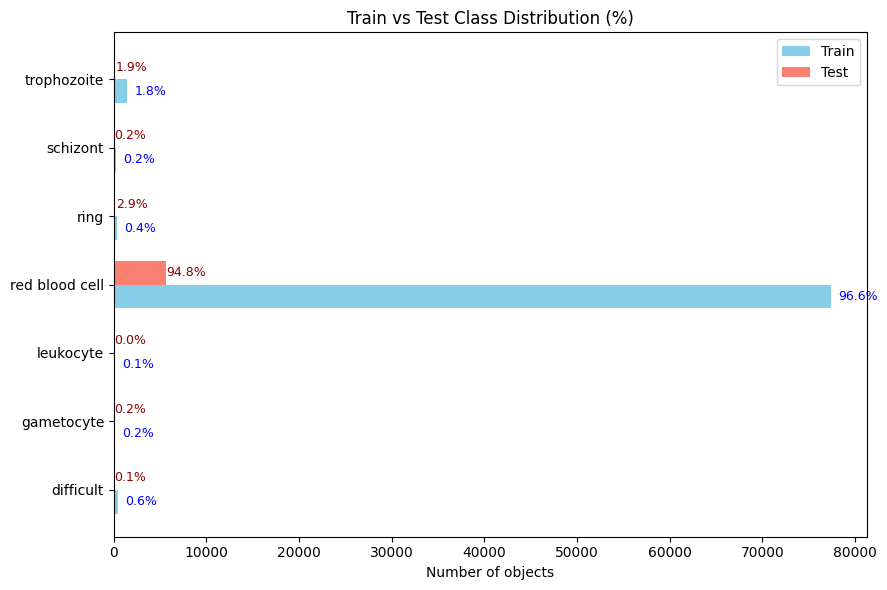

In [ ]:
# function to load class counts from a JSON file
def get_class_counts(json_path):
    with open(json_path) as f:
        data = json.load(f)
    if isinstance(data[0], list):
        data = data[0]
    categories = []
    for item in data:
        for obj in item["objects"]:
            categories.append(obj["category"])
    counts = Counter(categories)
    total = sum(counts.values())
    percentages = {cls: (count / total) * 100 for cls, count in counts.items()}
    return counts, percentages

# Load training and test sets ---
train_counts, train_perc = get_class_counts("/content/drive/MyDrive/malaria/training.json")
test_counts, test_perc = get_class_counts("/content/drive/MyDrive/malaria/test.json")

# Ensure consistent class order
all_classes = sorted(set(train_counts.keys()) | set(test_counts.keys()))

# Prepare data
train_vals = [train_counts.get(c, 0) for c in all_classes]
test_vals = [test_counts.get(c, 0) for c in all_classes]
train_pct = [train_perc.get(c, 0) for c in all_classes]
test_pct = [test_perc.get(c, 0) for c in all_classes]

# Print summary
print("TRAIN set:")
for c in all_classes:
    print(f"{c}: {train_counts.get(c, 0)} ({train_perc.get(c, 0):.2f}%)")
print("\n TEST set:")
for c in all_classes:
    print(f"{c}: {test_counts.get(c, 0)} ({test_perc.get(c, 0):.2f}%)")

# Plot side by side horizontal bars
y = np.arange(len(all_classes))
bar_height = 0.35

plt.figure(figsize=(9, 6))
plt.barh(y - bar_height/2, train_vals, height=bar_height, color='skyblue', label='Train')
plt.barh(y + bar_height/2, test_vals, height=bar_height, color='salmon', label='Test')

# Add percentage labels to the right
for i, c in enumerate(all_classes):
    plt.text(train_vals[i] + max(train_vals)*0.01, y[i] - bar_height/2,
             f"{train_pct[i]:.1f}%", va='center', fontsize=9, color='blue')
    plt.text(test_vals[i] + max(test_vals)*0.01, y[i] + bar_height/2,
             f"{test_pct[i]:.1f}%", va='center', fontsize=9, color='darkred')

plt.yticks(y, all_classes)
plt.xlabel("Number of objects")
plt.title("Train vs Test Class Distribution (%)")
plt.legend()
plt.tight_layout()
plt.show()


There are class imbalances in the test and train subsets. The proportion of uninfected red blood cells is highest.

**Check for mislabelled images in train data**

In [ ]:
# Collect all category names
all_categories = [obj["category"] for img in train_data for obj in img["objects"]]
unique_categories = sorted(set(all_categories))

print("Unique labels found in train dataset:", unique_categories)

# If you expect only these categories:
expected_labels = {'difficult','gametocyte','leukocyte', 'red blood cell', 'ring', 'schizont', 'trophozoite'}

# Check for unexpected labels
unexpected = [c for c in unique_categories if c not in expected_labels]
if unexpected:
    print("Found unexpected or misspelled categories:", unexpected)
else:
    print("All labels match expected categories.")

Unique labels found in train dataset: ['difficult', 'gametocyte', 'leukocyte', 'red blood cell', 'ring', 'schizont', 'trophozoite']
All labels match expected categories.


**Check for mislabelled images in test data**

In [ ]:
# Collect all category names
all_categories = [obj["category"] for img in test_data for obj in img["objects"]]
unique_categories = sorted(set(all_categories))

print("Unique labels found in test dataset:", unique_categories)

# If you expect only these categories:
expected_labels = {'difficult','gametocyte','leukocyte', 'red blood cell', 'ring', 'schizont', 'trophozoite'}

# Check for unexpected labels
unexpected = [c for c in unique_categories if c not in expected_labels]
if unexpected:
    print("Found unexpected or misspelled categories:", unexpected)
else:
    print("All labels match expected categories.")

Unique labels found in test dataset: ['difficult', 'gametocyte', 'red blood cell', 'ring', 'schizont', 'trophozoite']
All labels match expected categories.


**Check for any bounding box issues in train data**

In [ ]:
bad_boxes = []

for img_data in train_data:
    img_name = os.path.basename(img_data["image"]["pathname"])
    w = img_data["image"]["shape"]["c"]
    h = img_data["image"]["shape"]["r"]
    for obj in img_data["objects"]:
        box = obj["bounding_box"]
        xmin, ymin = box["minimum"]["c"], box["minimum"]["r"]
        xmax, ymax = box["maximum"]["c"], box["maximum"]["r"]
        if xmin >= xmax or ymin >= ymax:
            bad_boxes.append((img_name, "zero or negative box size"))
        elif xmin < 0 or ymin < 0 or xmax > w or ymax > h:
            bad_boxes.append((img_name, "box outside image bounds"))

print(f" Found {len(bad_boxes)} bounding box issues in train data.")
if bad_boxes:
    for i, (img, issue) in enumerate(bad_boxes[:10]):
        print(f"{i+1}. {img} → {issue}")


 Found 0 bounding box issues in train data.


**Check for any bounding box issues in test data**

In [ ]:
bad_boxes = []

for img_data in test_data:
    img_name = os.path.basename(img_data["image"]["pathname"])
    w = img_data["image"]["shape"]["c"]
    h = img_data["image"]["shape"]["r"]
    for obj in img_data["objects"]:
        box = obj["bounding_box"]
        xmin, ymin = box["minimum"]["c"], box["minimum"]["r"]
        xmax, ymax = box["maximum"]["c"], box["maximum"]["r"]
        if xmin >= xmax or ymin >= ymax:
            bad_boxes.append((img_name, "zero or negative box size"))
        elif xmin < 0 or ymin < 0 or xmax > w or ymax > h:
            bad_boxes.append((img_name, "box outside image bounds"))

print(f" Found {len(bad_boxes)} bounding box issues in test data.")
if bad_boxes:
    for i, (img, issue) in enumerate(bad_boxes[:10]):
        print(f"{i+1}. {img} → {issue}")

 Found 0 bounding box issues in test data.


There are no incorrectly drawn or out-of-bounds boxes in test and train subsets.

**Detect duplicate boxes on the same object in train data**

In [ ]:
from collections import defaultdict

duplicates = []
for img_data in train_data:
    seen = set()
    img_name = os.path.basename(img_data["image"]["pathname"])
    for obj in img_data["objects"]:
        box = obj["bounding_box"]
        coords = (
            box["minimum"]["c"], box["minimum"]["r"],
            box["maximum"]["c"], box["maximum"]["r"]
        )
        if coords in seen:
            duplicates.append(img_name)
        else:
            seen.add(coords)

duplicates = list(set(duplicates))
print(f" Found {len(duplicates)} images with duplicate bounding boxes in train subset.")
if duplicates:
    print("Examples:", duplicates[:10])

 Found 0 images with duplicate bounding boxes in train subset.


**Detect duplicate boxes on the same object in test data**

In [ ]:
duplicates = []
for img_data in test_data:
    seen = set()
    img_name = os.path.basename(img_data["image"]["pathname"])
    for obj in img_data["objects"]:
        box = obj["bounding_box"]
        coords = (
            box["minimum"]["c"], box["minimum"]["r"],
            box["maximum"]["c"], box["maximum"]["r"]
        )
        if coords in seen:
            duplicates.append(img_name)
        else:
            seen.add(coords)

duplicates = list(set(duplicates))
print(f" Found {len(duplicates)} images with duplicate bounding boxes in test subset.")
if duplicates:
    print("Examples:", duplicates[:10])

 Found 0 images with duplicate bounding boxes in test subset.


## **1.7 Prepare data for YOLO model**

Convert existing JSON annotation format to the YOLOv8 format (TXT files with normalized bounding box coordinates).

In [55]:
# Function to convert bounding box to YOLO format
def to_yolo(box, img_w, img_h):
    # x_center, y_center, width, height normalized to image size
    x_min, y_min = box["minimum"]["c"], box["minimum"]["r"]
    x_max, y_max = box["maximum"]["c"], box["maximum"]["r"]

    x_center = (x_min + x_max) / 2.0
    y_center = (y_min + y_max) / 2.0
    width = x_max - x_min
    height = y_max - y_min

    # Normalize coordinates
    x_center /= img_w
    y_center /= img_h
    width /= img_w
    height /= img_h

    return x_center, y_center, width, height

# Create a mapping from category names to class IDs
# Based on the category summary from cell 82oIK1lm5HH6
category_to_id = {
    "red blood cell": 0,
    "trophozoite": 1,
    "schizont": 2,
    "difficult": 3,
    "ring": 4,
    "leukocyte": 5,
    "gametocyte": 6
}

# Create directories for YOLO labels
os.makedirs("labels/train", exist_ok=True)
os.makedirs("labels/test", exist_ok=True)

# Process training data
for item in train_data:
    img_name = os.path.basename(item["image"]["pathname"])
    img_w = item["image"]["shape"]["c"]
    img_h = item["image"]["shape"]["r"]
    label_file_name = os.path.splitext(img_name)[0] + ".txt"
    label_file_path = os.path.join("labels/train", label_file_name)

    with open(label_file_path, "w") as f:
        for obj in item["objects"]:
            category = obj["category"].lower().strip()
            if category in category_to_id:
                class_id = category_to_id[category]
                x_c, y_c, w, h = to_yolo(obj["bounding_box"], img_w, img_h)
                f.write(f"{class_id} {x_c:.6f} {y_c:.6f} {w:.6f} {h:.6f}\n")

# Process test data
for item in test_data:
    img_name = os.path.basename(item["image"]["pathname"])
    img_w = item["image"]["shape"]["c"]
    img_h = item["image"]["shape"]["r"]
    label_file_name = os.path.splitext(img_name)[0] + ".txt"
    label_file_path = os.path.join("labels/test", label_file_name)

    with open(label_file_path, "w") as f:
        for obj in item["objects"]:
            category = obj["category"].lower().strip()
            if category in category_to_id:
                class_id = category_to_id[category]
                x_c, y_c, w, h = to_yolo(obj["bounding_box"], img_w, img_h)
                f.write(f"{class_id} {x_c:.6f} {y_c:.6f} {w:.6f} {h:.6f}\n")

print("Conversion to YOLO format complete.")

Conversion to YOLO format complete.


Now that the annotations are converted to YOLO format, you can create a YAML configuration file for training.

In [56]:
# Create the YAML configuration file for YOLOv8
yaml_config = {
    'path': '/content/drive/MyDrive/malaria',  # Dataset root directory
    'train': 'images',  # Train images (relative to 'path')
    'val': 'images',    # Validation images (relative to 'path') - using same for simplicity
    'test': 'images',   # Test images (relative to 'path') - using same for simplicity

    'nc': len(category_to_id),  # Number of classes
    'names': list(category_to_id.keys())  # Class names
}

# Save the YAML file
with open("malaria.yaml", "w") as f:
    yaml.dump(yaml_config, f, default_flow_style=False)

print("malaria.yaml created.")

malaria.yaml created.


In [43]:
# List some of the generated training label files
train_label_files = os.listdir("labels/train")
print("Example training label files:", train_label_files[:5])

Example training label files: ['8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.txt', '10be6380-cbbb-4886-8b9e-ff56b1710576.txt', '6b14c855-8561-417c-97a4-63fa552842fd.txt', '13099edb-35d9-438f-b093-2cf2ebf9d255.txt', '2559636b-f01a-4414-93da-210c3b12d153.txt']


In [44]:
# Display the content of the first few training label files
print("\nContent of first 2 training label files:")
for label_file in train_label_files[:2]:
    print(f"\n--- {label_file} ---")
    with open(os.path.join("labels/train", label_file), "r") as f:
        print(f.read())


Content of first 2 training label files:

--- 8d02117d-6c71-4e47-b50a-6cc8d5eb1d55.txt ---
0 0.931250 0.922917 0.062500 0.084167
0 0.845625 0.766250 0.062500 0.085833
0 0.596250 0.527917 0.067500 0.092500
0 0.413750 0.296667 0.063750 0.086667
0 0.588750 0.212500 0.076250 0.095000
0 0.954375 0.202500 0.058750 0.083333
0 0.901875 0.258750 0.073750 0.089167
0 0.216875 0.401250 0.056250 0.085833
0 0.780937 0.670833 0.073125 0.096667
0 0.314375 0.866250 0.061250 0.079167
0 0.862187 0.673750 0.066875 0.089167
0 0.103125 0.360000 0.056250 0.071667
0 0.283750 0.323750 0.057500 0.065833
0 0.427500 0.750417 0.077500 0.092500
0 0.088125 0.107917 0.072500 0.094167
0 0.744062 0.741250 0.054375 0.089167
0 0.179063 0.329167 0.066875 0.076667
0 0.291563 0.234167 0.060625 0.086667
0 0.498125 0.645417 0.068750 0.084167
0 0.195000 0.233333 0.056250 0.085000
0 0.858125 0.848333 0.053750 0.068333
0 0.245938 0.739583 0.064375 0.092500
0 0.681875 0.157917 0.070000 0.084167
0 0.146563 0.172083 0.070625 0.094

In [45]:
# List some of the generated test label files
test_label_files = os.listdir("labels/test")
print("Example test label files:", test_label_files[:5])

Example test label files: ['41be1bd3-0d31-4881-bf1f-3ccdfa21ff12.txt', '64985a1e-16bb-4016-a01c-c21a5b86e572.txt', 'c70894fa-50e8-4eed-a5a8-159a20153a49.txt', 'abb72ce2-4193-4dd3-a34c-61c2ee22ccff.txt', '8db76867-671a-4488-a7b6-991e4dd2e05f.txt']


In [46]:
# Display the content of the first few test label files
print("\nContent of first 2 test label files:")
for label_file in test_label_files[:2]:
    print(f"\n--- {label_file} ---")
    with open(os.path.join("labels/test", label_file), "r") as f:
        print(f.read())


Content of first 2 test label files:

--- 41be1bd3-0d31-4881-bf1f-3ccdfa21ff12.txt ---
0 0.932870 0.464208 0.071502 0.095445
0 0.674383 0.665221 0.063786 0.082430
0 0.844650 0.197035 0.070988 0.090383
0 0.611368 0.780550 0.066358 0.090383
0 0.879115 0.458062 0.055556 0.088937
0 0.703704 0.385756 0.062757 0.081706
0 0.342850 0.741504 0.073560 0.091829
0 0.909722 0.349964 0.071502 0.096891
0 0.427212 0.884309 0.065329 0.088214
0 0.367284 0.823933 0.061728 0.086045
0 0.724537 0.741142 0.072531 0.092552
0 0.500000 0.495300 0.063786 0.088214
0 0.713992 0.858279 0.070988 0.093999
0 0.281379 0.684743 0.072016 0.082430
0 0.247171 0.422270 0.072531 0.101229
0 0.960134 0.302242 0.066358 0.105568
0 0.056070 0.225235 0.077160 0.091829
0 0.425412 0.682936 0.074074 0.100506
0 0.126286 0.107737 0.061214 0.092552
0 0.797068 0.469270 0.064300 0.085322
0 0.607767 0.627260 0.052984 0.068691
0 0.799383 0.679320 0.073045 0.104845
0 0.482767 0.639190 0.065329 0.083876
0 0.821759 0.285973 0.073560 0.100506


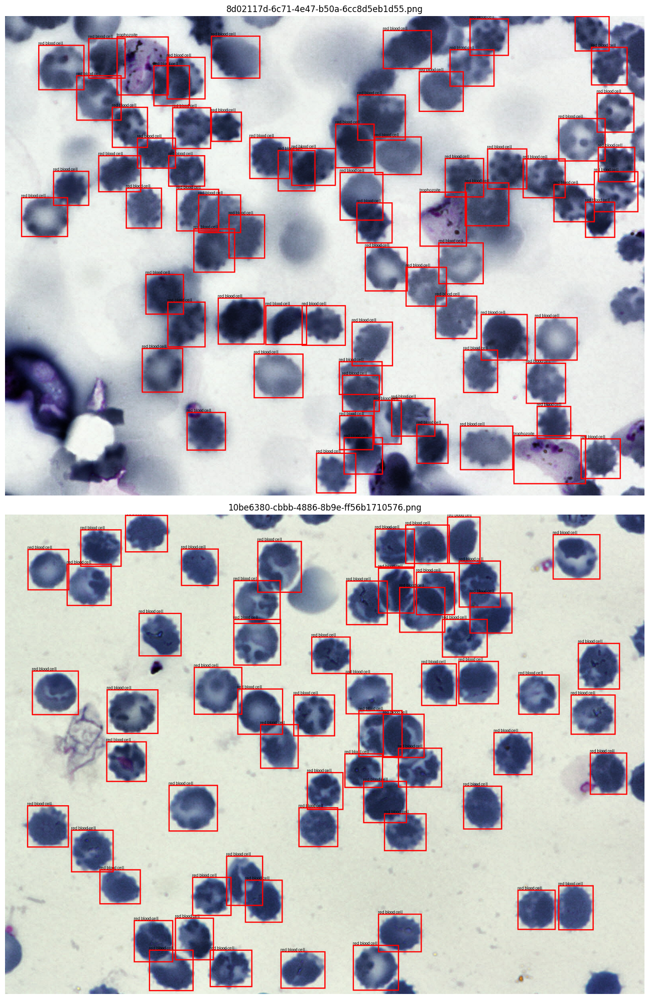

In [47]:
# Function to convert YOLO coordinates back to pixel coordinates
def from_yolo(x_center, y_center, width, height, img_w, img_h):
    xmin = int((x_center - width/2) * img_w)
    ymin = int((y_center - height/2) * img_h)
    xmax = int((x_center + width/2) * img_w)
    ymax = int((y_center + height/2) * img_h)
    return xmin, ymin, xmax, ymax

# Get the list of training label files again (if not already available)
train_label_files = os.listdir("labels/train")
image_folder = "/content/drive/MyDrive/malaria/images"

# Try loading a font (fallback to default)
try:
    font = ImageFont.truetype("arial.ttf", 34)
except:
    font = ImageFont.load_default()

plt.figure(figsize=(20, 20))

# Process the first two training label files
for idx, label_file in enumerate(train_label_files[:2]):
    img_name = os.path.splitext(label_file)[0] + ".png"  # Assuming original images are PNG
    img_path = os.path.join(image_folder, img_name)

    try:
        img = Image.open(img_path).convert("RGB")
        img_w, img_h = img.size
        draw = ImageDraw.Draw(img)

        label_file_path = os.path.join("labels/train", label_file)
        with open(label_file_path, "r") as f:
            for line in f:
                class_id, x_c, y_c, w, h = map(float, line.strip().split())
                xmin, ymin, xmax, ymax = from_yolo(x_c, y_c, w, h, img_w, img_h)

                # Get category name from class_id
                category = list(category_to_id.keys())[int(class_id)]

                draw.rectangle([xmin, ymin, xmax, ymax], outline="red", width=3)
                draw.text((xmin, ymin - 10), category, fill="black", font=font)

        plt.subplot(2, 1, idx + 1)
        plt.imshow(img)
        plt.title(img_name)
        plt.axis("off")

    except FileNotFoundError:
        print(f"Image file not found: {img_path}")
    except Exception as e:
        print(f"Error processing image {img_name}: {e}")

plt.tight_layout()
plt.show()

In [59]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8n.pt')  # load a pretrained model.
# yolov8n is the smallest size which is the fastest, has lowest parameters.A good baseline model size to start with.

# Train the model
model.train(data='malaria.yaml', epochs=100, imgsz=640, augment=True)

Ultralytics 8.3.221 🚀 Python-3.12.12 torch-2.8.0+cu126 CUDA:0 (Tesla T4, 15095MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=True, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=malaria.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=100, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolov8n.pt, momentum=0.937, mosaic=1.0, multi_scale=False, name=train5, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, perspective=0.0, plots=True, pose=12.0, pretrained

KeyboardInterrupt: 

In [58]:
import os

cache_file = "/content/drive/MyDrive/malaria/labels.cache"
if os.path.exists(cache_file):
    os.remove(cache_file)
    print(f"Removed old cache file: {cache_file}")
else:
    print("Cache file not found, no need to remove.")

Removed old cache file: /content/drive/MyDrive/malaria/labels.cache


In [54]:
import yaml

with open("malaria.yaml", "r") as f:
    yaml_content = yaml.safe_load(f)

print("Content of malaria.yaml:")
print(yaml.dump(yaml_content, default_flow_style=False))

Content of malaria.yaml:
names:
- red blood cell
- trophozoite
- schizont
- difficult
- ring
- leukocyte
- gametocyte
nc: 7
path: /content/drive/MyDrive/malaria
test: labels/test
train: labels/train
val: labels/test

